In [1]:
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pydicom as dicom
import pydicom
import json
import glob
import collections
from pydicom.pixel_data_handlers.util import apply_voi_lut
import cv2
from skimage import measure
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.graph_objects as go
import random
from glob import glob
import warnings
warnings.filterwarnings('ignore')

In [2]:
label_coordinates_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
train_series = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
df_train = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
df_sub = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
test_series = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')

In [3]:
def split_pathology(pathology):
    x = [word[0].upper()+word[1:] for word in pathology.split('_')]
    condition = ""
    for i in x[:-2]:
        condition += i
        condition += " "
    level = x[-2] + "/" + x[-1]
    return condition[:-1], level

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/63725508/2144061947/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/105895264/1073066831/12.dcm


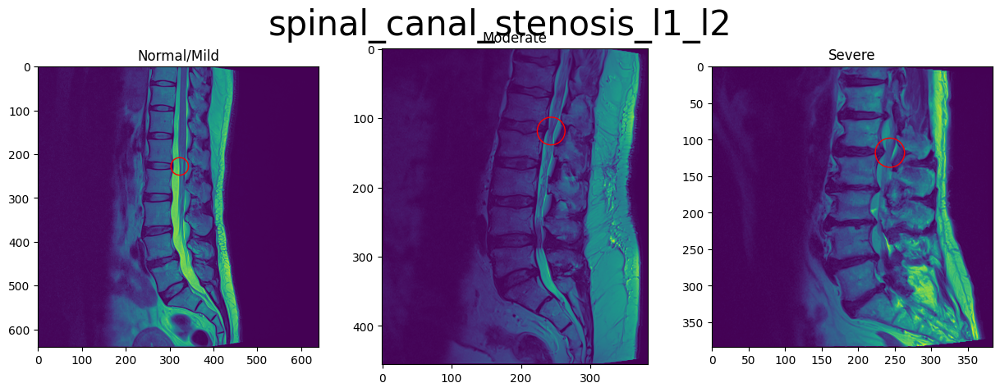

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/29931867/1676821058/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/52397721/2452297573/9.dcm


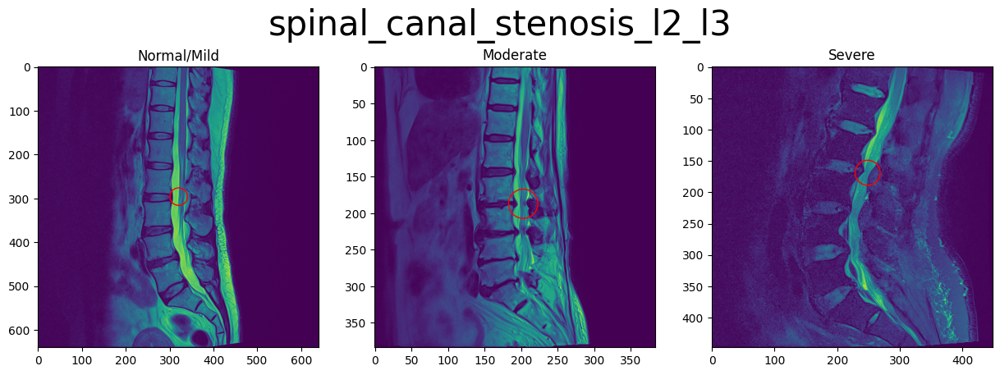

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3666319702/9.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/52397721/2452297573/9.dcm


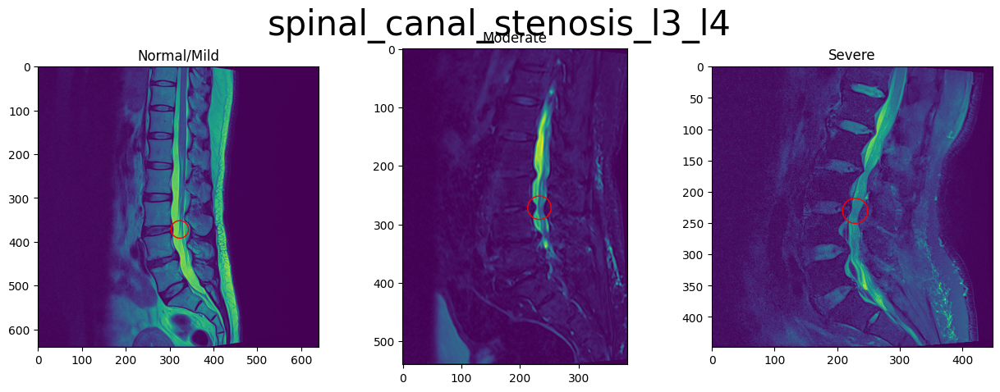

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/38281420/880361156/9.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3666319702/10.dcm


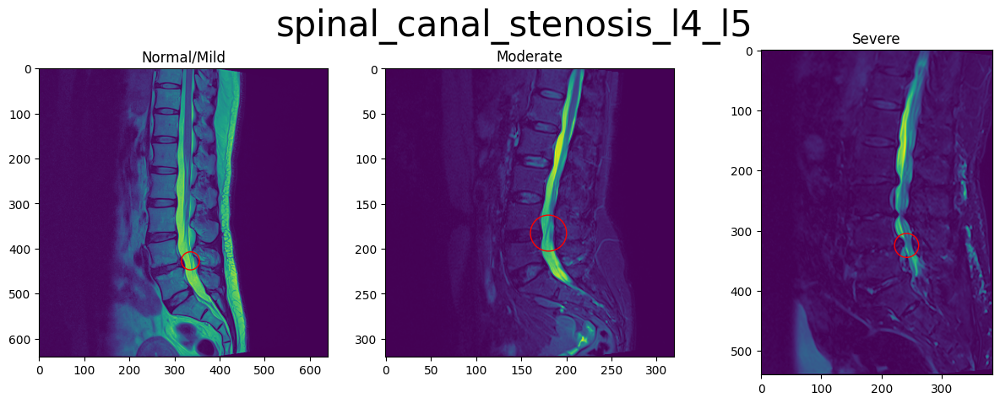

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/702807833/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/305152236/2421706412/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/719139061/3146177815/8.dcm


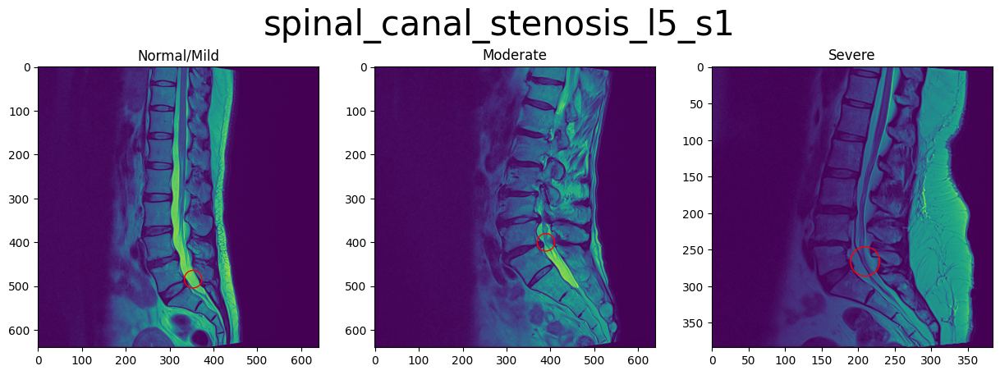

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/75336136/1335435066/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/325485990/3882396085/10.dcm


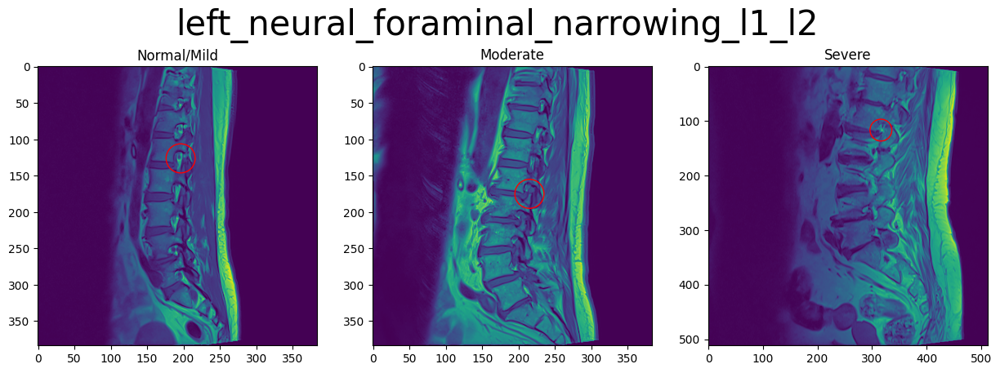

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/52695609/3284178089/6.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/607371793/462456006/6.dcm


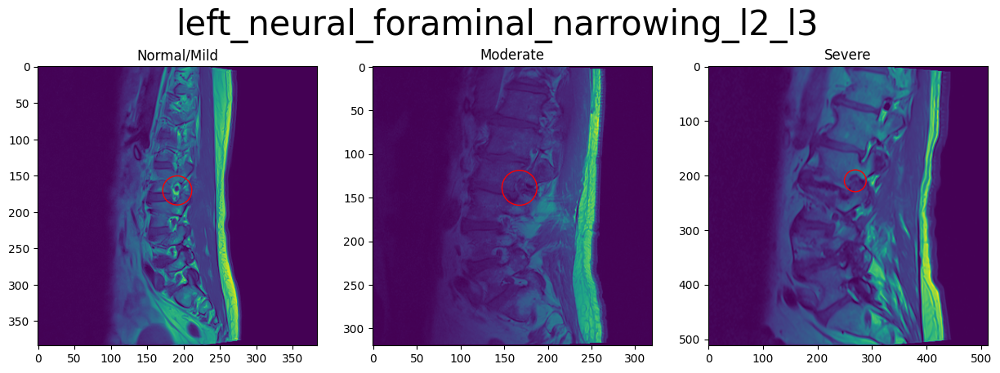

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/41477684/3009399271/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/267842058/894248358/11.dcm


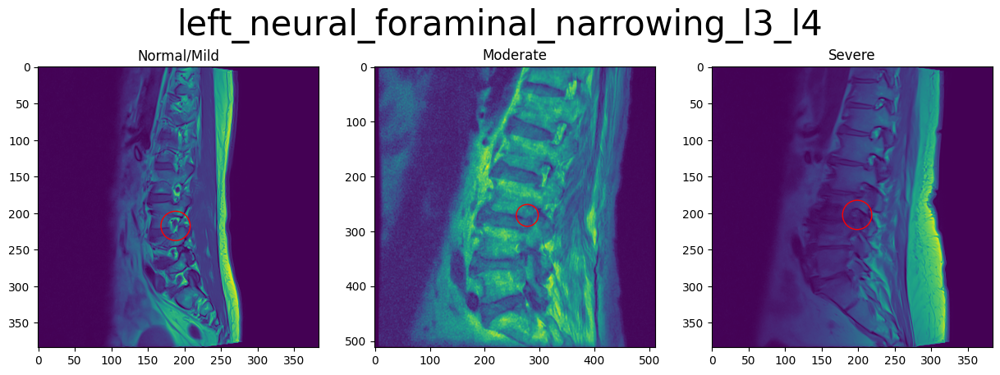

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/7143189/3219733239/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/70878995/2807935482/11.dcm


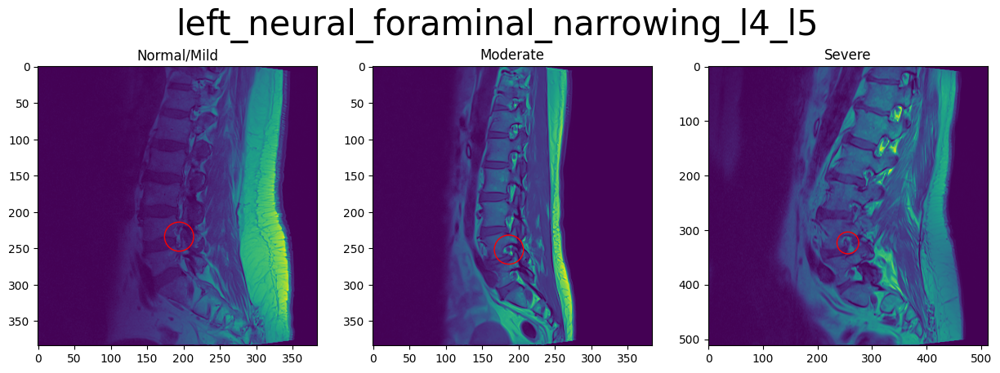

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3486248476/7.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/13317052/1539051863/12.dcm


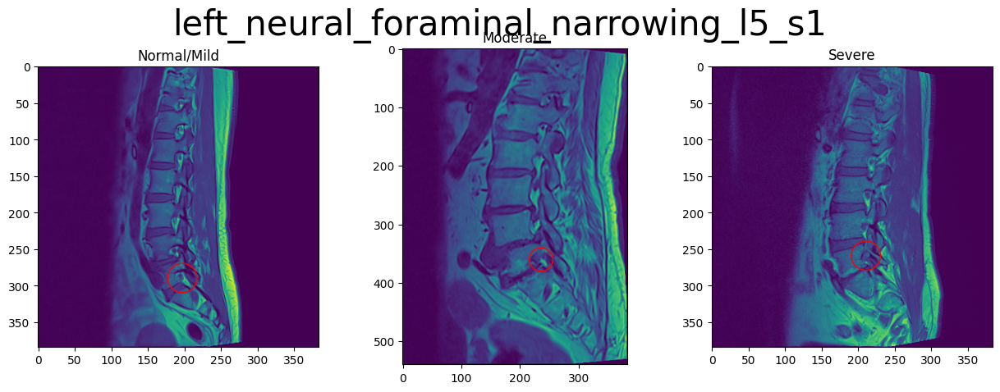

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/6.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/75336136/1335435066/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/52695609/3284178089/12.dcm


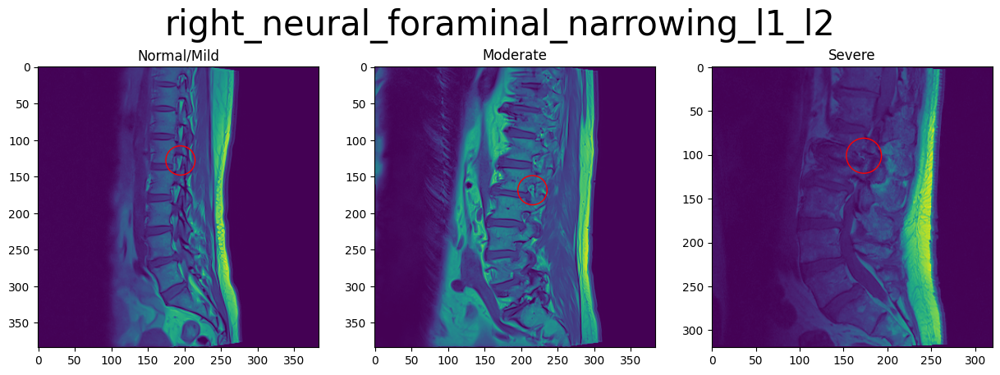

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/6.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/52695609/3284178089/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/185510290/1468777659/12.dcm


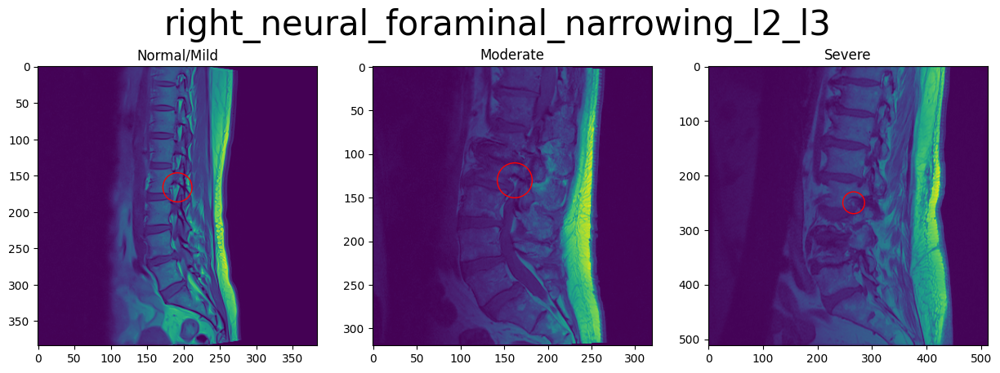

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/7143189/3219733239/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/96439573/557434766/13.dcm


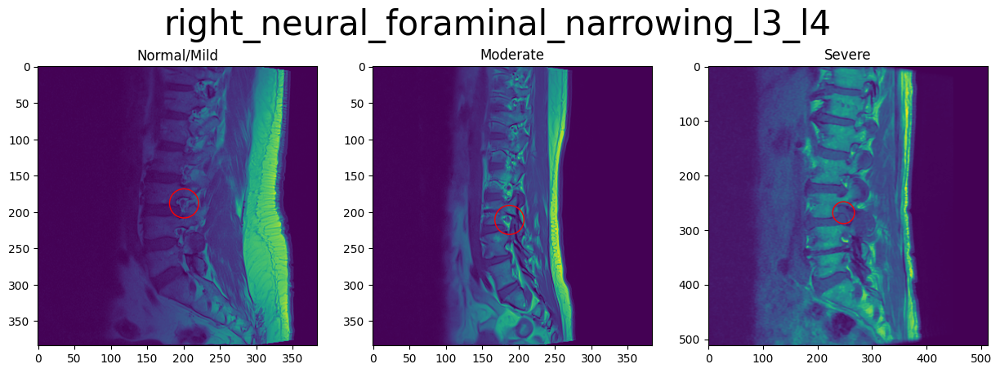

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/7143189/3219733239/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/4.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/74294498/3485741709/4.dcm


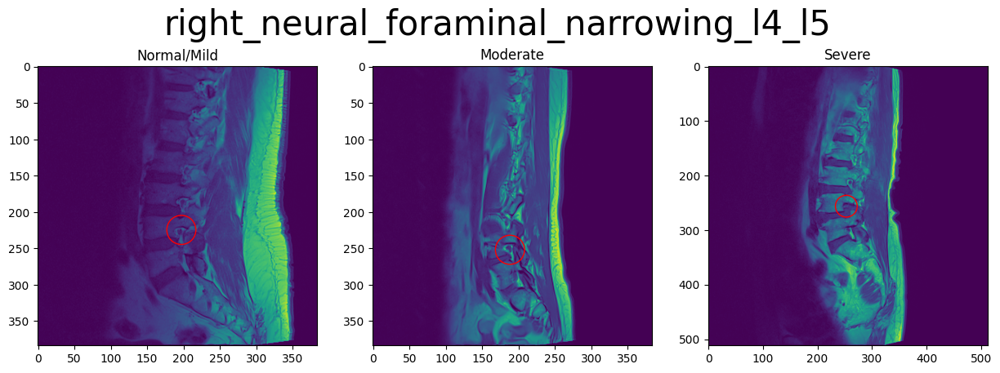

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/1054713880/4.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/22191399/434280813/5.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/38281420/2565838687/5.dcm


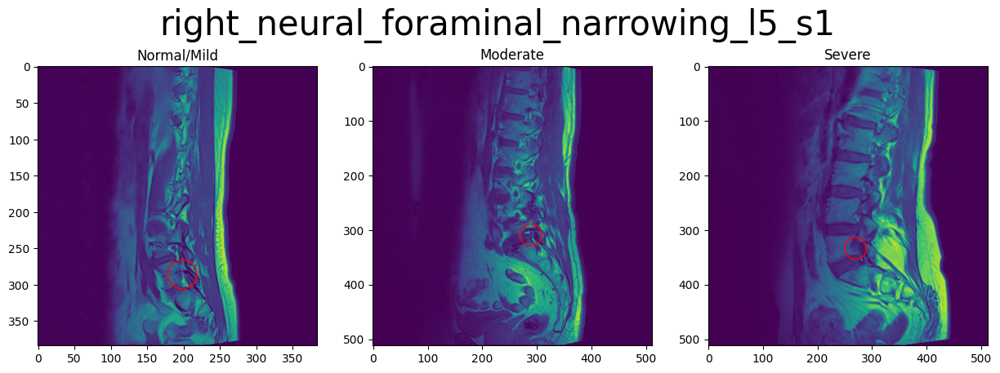

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/3.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/41477684/3749739759/4.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/75336136/3843947211/7.dcm


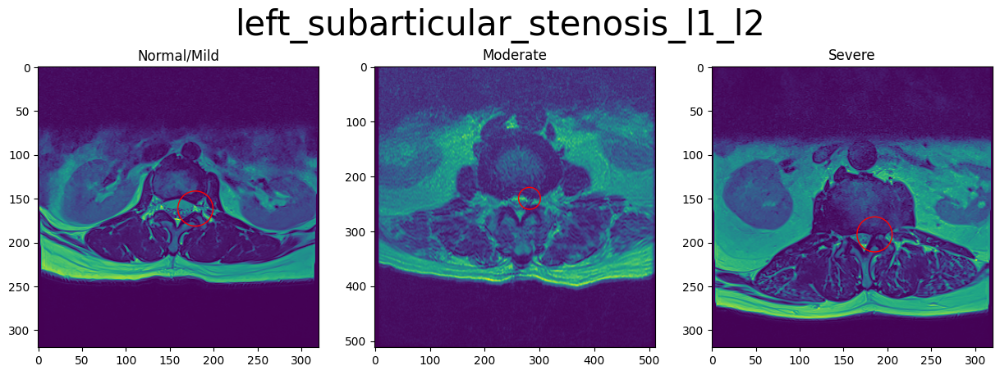

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/41477684/3749739759/9.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/75336136/3843947211/14.dcm


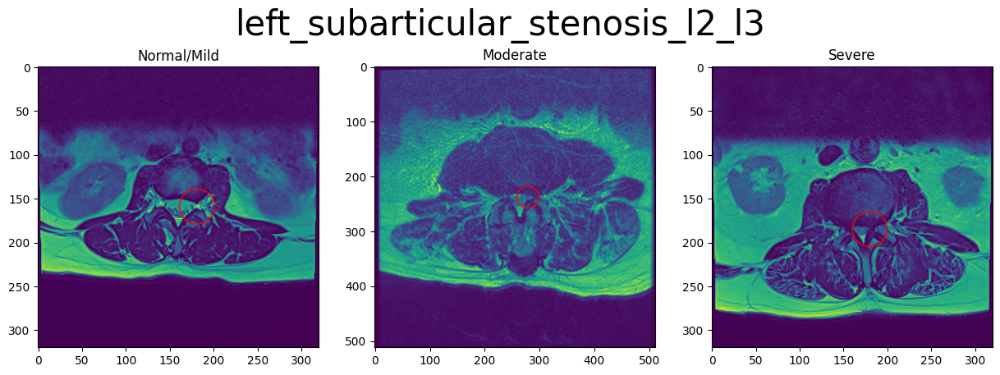

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/19.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/11340341/1224932122/24.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/41477684/3749739759/14.dcm


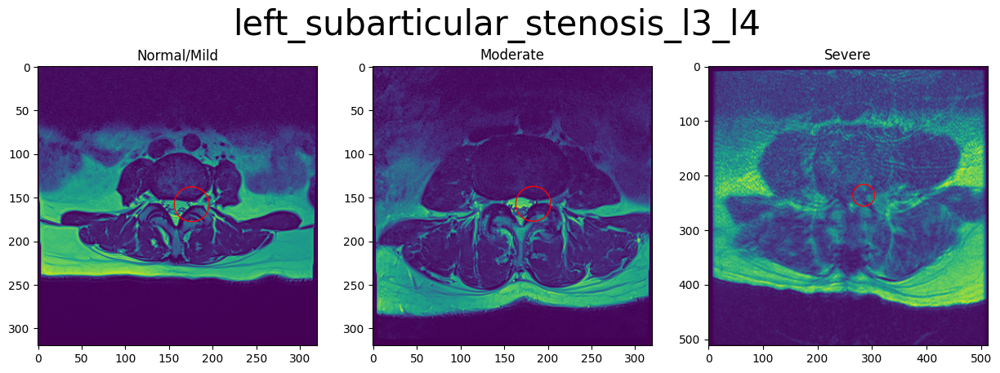

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/7143189/1951927562/16.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/28.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3201256954/34.dcm


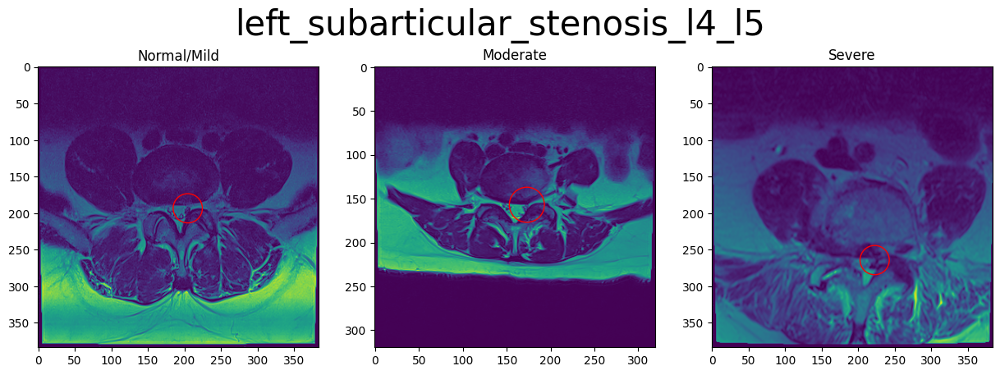

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/35.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/11943292/3800798510/16.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/73783367/1885677897/35.dcm


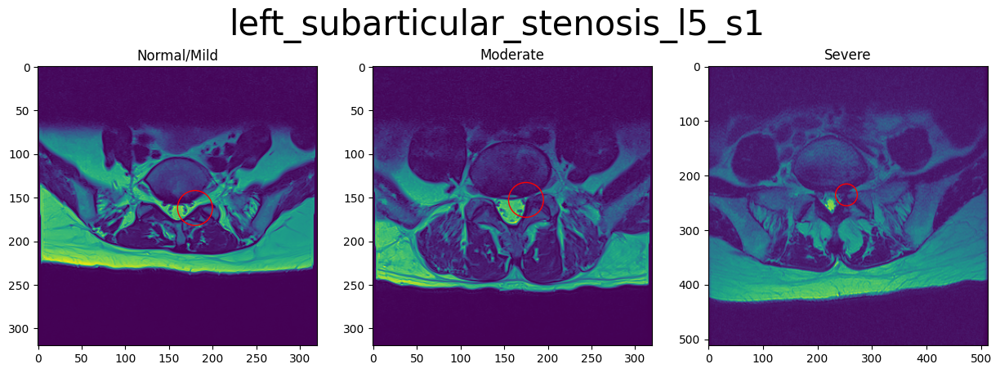

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/4.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/29931867/2261718442/8.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/228290246/1279357314/8.dcm


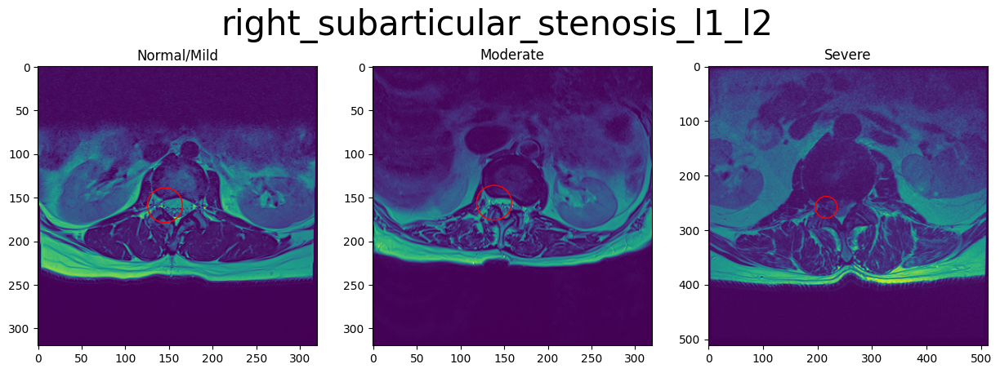

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/11.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3201256954/22.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/29931867/2261718442/13.dcm


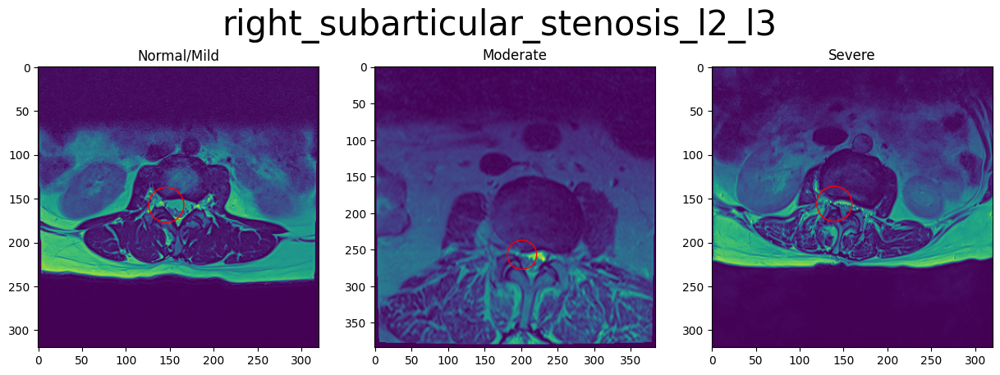

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/19.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3201256954/28.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/29931867/2261718442/18.dcm


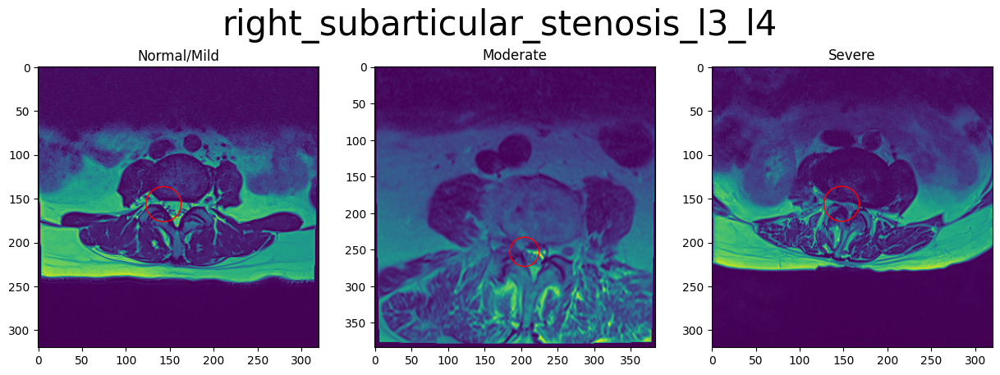

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/28.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4646740/3201256954/34.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/22191399/3687121182/37.dcm


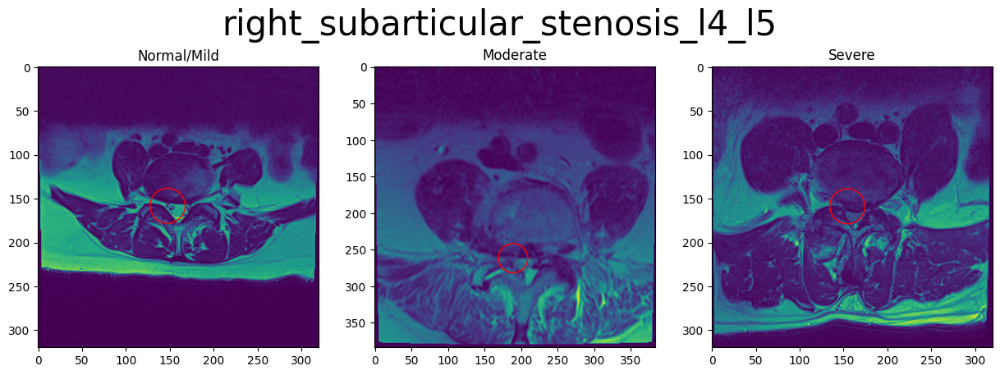

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/4003253/2448190387/35.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/13317052/2500166693/25.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/29931867/2261718442/29.dcm


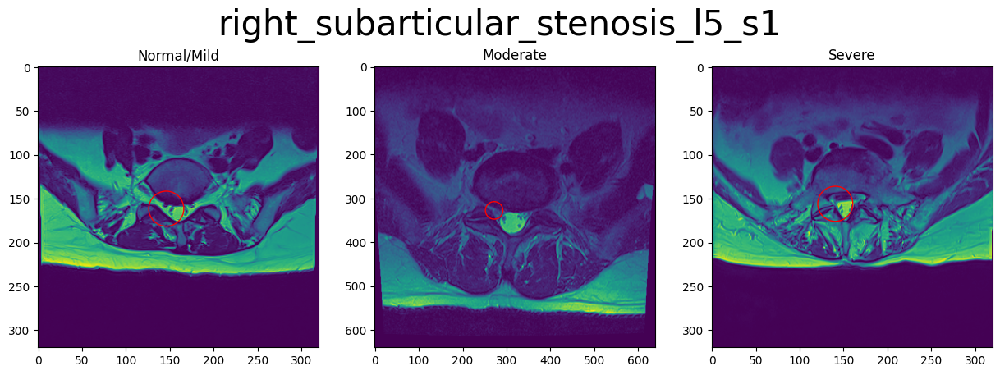

In [4]:
folder_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images'
pathologies = list(df_train)[1:]
stage = ['Normal/Mild', 'Moderate', 'Severe']
for p in pathologies:
    i = 0
    fig, ax = plt.subplots(1,3, figsize=(15,5))
    for s in stage:
        patient = df_train.loc[df_train[p] == s]
        condition, level = split_pathology(p)
    
        instances = label_coordinates_df.loc[(label_coordinates_df['study_id'] == list(patient.study_id)[0]) 
                                 & (label_coordinates_df['condition'] == condition) 
                                 & (label_coordinates_df['level'] == level) ]

        for index, row in instances.iterrows():
            study_id = str(row['study_id'])
            series_id = str(row['series_id'])
            instance_number = str(row['instance_number']) + '.dcm'
            x = row['x']
            y = row['y']
            
        
        instance_path = os.path.join(folder_path, study_id, series_id, instance_number)

        print(instance_path)
        # load image
        ds = dicom.dcmread(instance_path)
        # and plot
        # plt.plot(x, y, 'ro')
#         fig, ax = plt.subplots(3)
        ax[i].imshow(ds.pixel_array)
        circle = plt.Circle((x, y), 20, fill = False, color='r' )
        ax[i].add_patch(circle)
        ax[i].title.set_text(s)
        i += 1
#     plt.figure(figsize=(30,10))
    fig.suptitle(p, fontsize=30)
    plt.show()

In [5]:
df_sub.to_csv('submission.csv', index=False)